# **Product Recognition of Food Products**

## Image Processing and Computer Vision - Assignment Module \#1


Contacts:

- Prof. Giuseppe Lisanti -> giuseppe.lisanti@unibo.it
- Prof. Samuele Salti -> samuele.salti@unibo.it
- Alex Costanzino -> alex.costanzino@unibo.it
- Francesco Ballerini -> francesco.ballerini4@unibo.it


Computer vision-based object detection techniques can be applied in super market settings to build a system that can identify products on store shelves.
An example of how this system could be used would be to assist visually impaired customers or automate common store management tasks like detecting low-stock or misplaced products, given an image of a shelf in a store.

## Task
Develop a computer vision system that, given a reference image for each product, is able to identify such product from one picture of a store shelf.

<figure>
<a href="https://imgbb.com/">
  <center>
  <img src="https://i.ibb.co/TwkMWnH/Screenshot-2024-04-04-at-14-54-51.png" alt="Screenshot-2024-04-04-at-14-54-51" border="0" width="300" />
</a>
</figure>

For each type of product displayed in the
shelf the system should report:
1. Number of instances;
1. Dimension of each instance (width and height in pixel of the bounding box that enclose them);
1. Position in the image reference system of each instance (center of the bounding box that enclose them).

#### Example of expected output
```
Product 0 - 2 instance found:
  Instance 1 {position: (256, 328), width: 57px, height: 80px}
  Instance 2 {position: (311, 328), width: 57px, height: 80px}
Product 1 – 1 instance found:
.
.
.
```

### Track A - Single Instance Detection
Develop an object detection system to identify single instance of products given one reference image for each item and a scene image.

The system should be able to correctly identify all the product in the shelves
image.

### Track B - Multiple Instances Detection
In addition to what achieved at step A, the system should also be able to detect multiple instances of the same product.

## Data
Two folders of images are provided:
* **Models**: contains one reference image for each product that the system should be able to identify.
* **Scenes**: contains different shelve pictures to test the developed algorithm in different scenarios. The images contained in this folder are corrupted by noise.

#### Track A - Single Instance Detection
* **Models**: {ref1.png to ref14.png}.
* **Scenes**: {scene1.png to scene5.png}.

#### Track B - Multiple Instances Detection
* **Models**: {ref15.png to ref27.png}.
* **Scenes**: {scene6.png to scene12.png}.

In [1]:
from google.colab import drive
drive.mount('/content/drive')

!cp -r /content/drive/MyDrive/LabSessionsIPCV/AssignmentsIPCV/dataset.zip ./
!unzip dataset.zip

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Archive:  dataset.zip
replace __MACOSX/._dataset? [y]es, [n]o, [A]ll, [N]one, [r]ename: A
  inflating: __MACOSX/._dataset      
  inflating: __MACOSX/dataset/._scenes  
  inflating: dataset/.DS_Store       
  inflating: __MACOSX/dataset/._.DS_Store  
  inflating: __MACOSX/dataset/._models  
  inflating: dataset/scenes/scene12.png  
  inflating: __MACOSX/dataset/scenes/._scene12.png  
  inflating: dataset/scenes/scene10.png  
  inflating: __MACOSX/dataset/scenes/._scene10.png  
  inflating: dataset/scenes/scene11.png  
  inflating: __MACOSX/dataset/scenes/._scene11.png  
  inflating: dataset/scenes/scene5.png  
  inflating: __MACOSX/dataset/scenes/._scene5.png  
  inflating: dataset/scenes/scene4.png  
  inflating: __MACOSX/dataset/scenes/._scene4.png  
  inflating: dataset/scenes/scene6.png  
  inflating: __MACOSX/dataset/scenes/._scene6.png  
  inflating: da

## Evaluation criteria
1. **Procedural correctness**. There are several ways to solve the assignment. Design your own sound approach and justify every decision you make;

2. **Clarity and conciseness**. Present your work in a readable way: format your code and comment every important step;

3. **Correctness of results**. Try to solve as many instances as possible. You should be able to solve all the instances of the assignment, however, a thoroughly justified and sound procedure with a lower number of solved instances will be valued **more** than a poorly designed approach.



---



# Solutions

In [2]:
# Import useful libraries
import numpy as np
import cv2
import os
from matplotlib import pyplot as plt

In [3]:
# change directory
os.chdir("dataset")

only for testing purposes: where each product in each ref image is actually present in the scenes images

single instance detection:
* ref1: scene1/scene4
* ref2: scene1
* ref3: scene2
* ref4: scene2
* ref5: scene2
* ref6: scene3
* ref7: scene3
* ref8: scene3/scene4
* ref9: scene4
* ref10: scene4
* ref11: scene5
* ref12: scene5
* ref13: /
* ref14: /

multiple instances detection:
* ref15: scene6 x2
* ref16: scene7 x2
* ref17 and ref23 are the same image: scene8 x2/scene11 x2
* ref18: scene9 x2/scene12 x2
* ref19: scene9 x2
* ref20: scene9 x2
* ref21: scene10 x2
* ref22: scene10 x2
* ref24: scene8 x1/scene11 x2
* ref25: scene11 x3
* ref26: scene8 x1/scene12 x2
* ref27: scene12 x2






## Track A

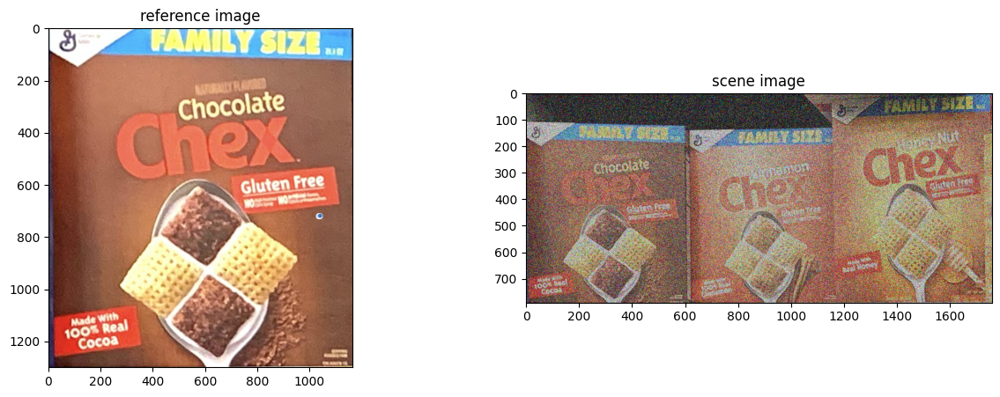

In [ ]:
# @title Read and show two samples images, a reference image and a scene image
ref = cv2.imread("models/ref6.png", cv2.IMREAD_COLOR) # or set flag 1
ref_color = cv2.cvtColor(ref, cv2.COLOR_BGR2RGB) # convert to RGB format
scene = cv2.imread("scenes/scene3.png", 1)
scene_color = cv2.cvtColor(scene, cv2.COLOR_BGR2RGB)

fig, ax = plt.subplots(1, 2, figsize=(15, 5))
ax[0].imshow(ref_color)
ax[0].set_title("reference image")
ax[1].imshow(scene_color)
ax[1].set_title("scene image")
plt.show()

We notice that all of these images are **colored** images, thus they have 3 channels associated with, one for each color.

Since SIFT works more efficeintly with grayscale images, which have only one channel and it can lead to faster computation compared to color images with multiple channels, **we convert** our colored images into **grayscale** images.

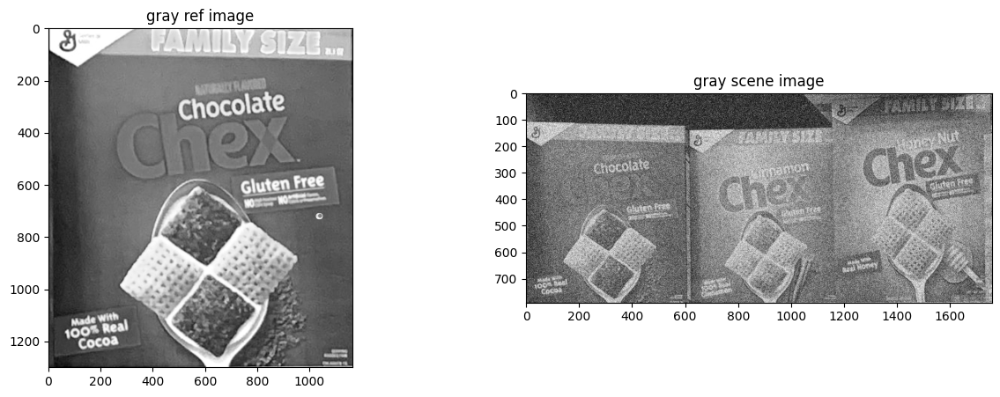

In [ ]:
# @title Conversion to grayscale
ref = cv2.cvtColor(ref_color, cv2.COLOR_BGR2GRAY)
gray_scene = cv2.cvtColor(scene_color, cv2.COLOR_BGR2GRAY)

fig, ax = plt.subplots(1, 2, figsize=(15, 5))
ax[0].imshow(ref, cmap = "gray")
ax[0].set_title("gray ref image")
ax[1].imshow(gray_scene, cmap = "gray")
ax[1].set_title("gray scene image")
plt.show()

### Denoising images
We can clearly see that scene images are corrupted by **noise**.
In order to design our denoising process in a reasonable way, we have to consider two pivotal facts:

1. **Preserving edges**: since our task is an Instance-detection task, preserving edges is crucial.
2. **Gaussian nature of the noise**: we notice that our images are mainly corrupted by Gaussian noise.

Since we can preserve edges by only using **non-linear filters**, we need to include one of them in our denoising process. Even though linear filters (e.g. Gaussian filter) can effectively reduce noise, they blurs the image.

Therefore we will try different combinations of linear and non-linear filters to accomplish this denoising task in the most efficient way.

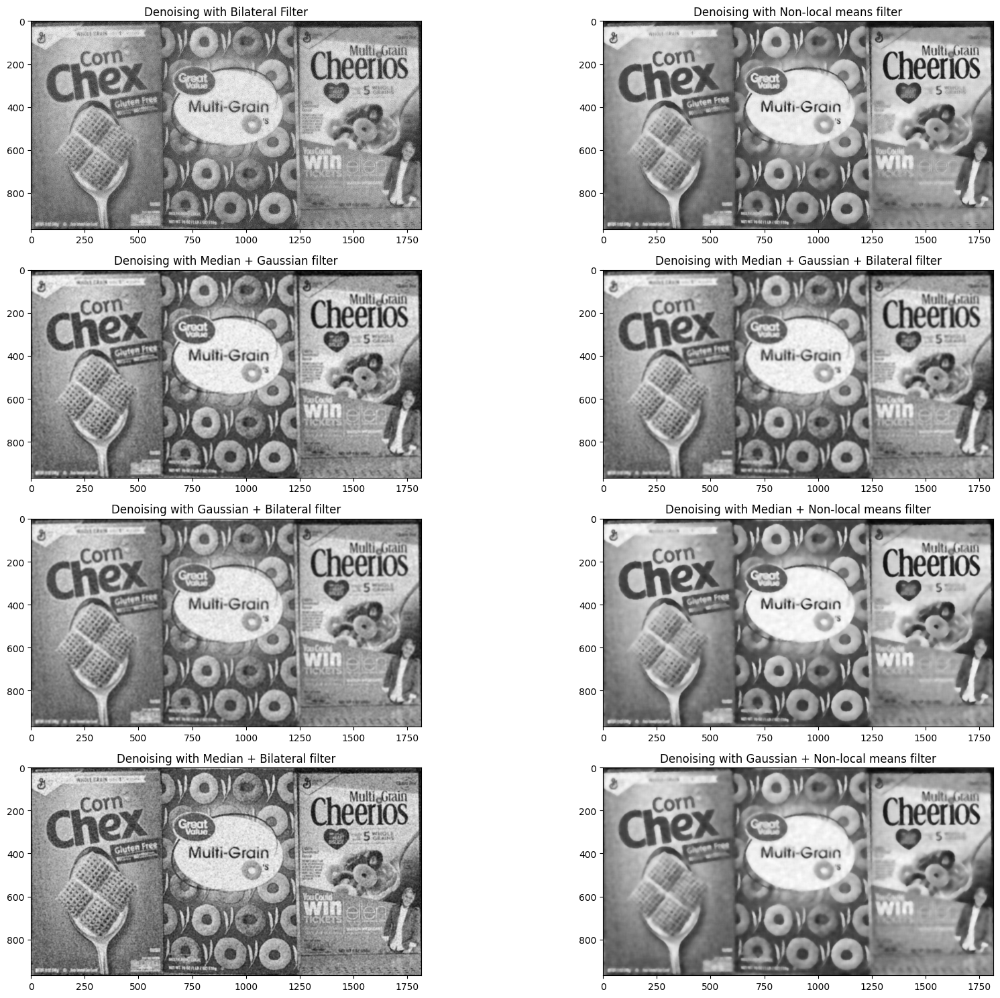

In [ ]:
#@title Different combinations of filters
fig, ax = plt.subplots(4, 2, figsize=(20,15))

'''
# Plot single image in the first row, spanning across both columns
ax_top = plt.subplot2grid((5, 2), (0, 0), colspan=2);
ax_top.imshow(gray_scene, cmap="gray")
ax_top.set_title("Original noisy image")
ax_top = ax[0, 1]
ax_top.axis('off')
'''

sigma = 2
k_size = int(2*(3*sigma) + 1)

ax[0,0].set_title("Denoising with Bilateral Filter")
# sigmaColor controls the color space filtering: in particular, controls the degree to which pixels with similar intensity values are considered for smoothing
# sigmaSpace controls the spatial filtering: it specifies how far from the central pixel the filter will consider neighboring pixels.
denoised_bf = cv2.bilateralFilter(gray_scene, d = 20, sigmaColor=75, sigmaSpace=75)
ax[0,0].imshow(denoised_bf, cmap="gray")

ax[0,1].set_title("Denoising with Non-local means filter")
denoised_nlf = cv2.fastNlMeansDenoising(gray_scene, None, h=50, templateWindowSize=7, searchWindowSize=21)
ax[0,1].imshow(denoised_nlf, cmap="gray")

ax[1,0].set_title("Denoising with Median + Gaussian filter")
# We have to apply the median filter before, otherwise I will spread the impulse noise on the whole image
denoised_mgf = cv2.GaussianBlur(cv2.medianBlur(gray_scene, ksize=9), (k_size, k_size), sigma)
ax[1,0].imshow(denoised_mgf, cmap="gray")

ax[1,1].set_title("Denoising with Median + Gaussian + Bilateral filter")
denoised_ggf = cv2.bilateralFilter(cv2.GaussianBlur(cv2.medianBlur(gray_scene, ksize=7), (k_size, k_size), sigma), d = 12, sigmaColor=75, sigmaSpace=75)
ax[1,1].imshow(denoised_ggf, cmap="gray")

ax[2,0].set_title("Denoising with Gaussian + Bilateral filter")
denoised_gbf = cv2.bilateralFilter(cv2.GaussianBlur(gray_scene, (k_size, k_size), sigma), d = 12, sigmaColor=75, sigmaSpace=75)
ax[2,0].imshow(denoised_gbf, cmap="gray")

ax[2,1].set_title("Denoising with Median + Non-local means filter")
denoised_mnf = cv2.fastNlMeansDenoising(cv2.medianBlur(gray_scene, ksize=7), None, h=50, templateWindowSize=7, searchWindowSize=21)
ax[2,1].imshow(denoised_mnf, cmap="gray")

ax[3,0].set_title("Denoising with Median + Bilateral filter")
# We have to apply the median filter before, otherwise I will spread the impulse noise on the whole image
denoised_mbf = cv2.bilateralFilter(cv2.medianBlur(gray_scene, ksize=5), d = 7, sigmaColor=75, sigmaSpace=75)
ax[3,0].imshow(denoised_mbf, cmap="gray")

ax[3,1].set_title("Denoising with Gaussian + Non-local means filter")
# We have to apply the median filter before, otherwise I will spread the impulse noise on the whole image
denoised_gnf = cv2.fastNlMeansDenoising(cv2.GaussianBlur(gray_scene, (k_size, k_size), sigma),  None, h=50, templateWindowSize=7, searchWindowSize=21)
ax[3,1].imshow(denoised_gnf, cmap="gray")

plt.subplots_adjust(left=0.1, right=0.9, bottom=0.1, top=0.9, wspace=0.2, hspace=0.5)
plt.tight_layout()
plt.show()

> As we can see, applying just a linear filter (or a combination of them) results in blurred edges, a situation that we want firmly to avoid.


Let's compare which denoising process actually performs the best by visualizing the extracted keypoints using the SIFT descriptor for each denoised image with a different filter.

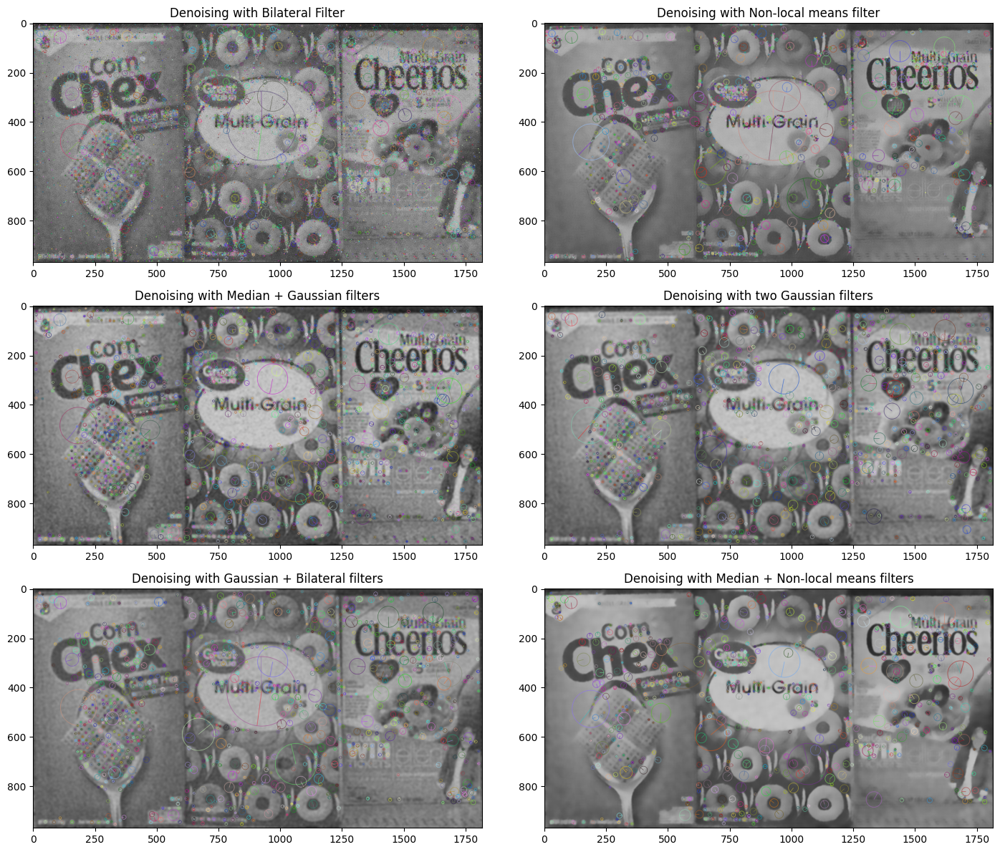

In [ ]:
#@title Visualizing keypoints for each combination of filters
fig, ax = plt.subplots(3, 2, figsize=(15,12))

sigma = 3
k_size = int(2*(3*sigma) + 1)

ax[0,0].set_title("Denoising with Bilateral Filter")
kp_image, des_image, image_with_kp = sift_detect_and_visualize(denoised_bf)
ax[0,0].imshow(image_with_kp, cmap="gray")

ax[0,1].set_title("Denoising with Non-local means filter")
kp_image, des_image, image_with_kp = sift_detect_and_visualize(denoised_nlf)
ax[0,1].imshow(image_with_kp, cmap="gray")

ax[1,0].set_title("Denoising with Median + Gaussian filters")
kp_image, des_image, image_with_kp = sift_detect_and_visualize(denoised_mgf)
ax[1,0].imshow(image_with_kp, cmap="gray")

ax[1,1].set_title("Denoising with two Gaussian filters")
kp_image, des_image, image_with_kp = sift_detect_and_visualize(denoised_ggf)
ax[1,1].imshow(image_with_kp, cmap="gray")

ax[2,0].set_title("Denoising with Gaussian + Bilateral filters")
kp_image, des_image, image_with_kp = sift_detect_and_visualize(denoised_gbf)
ax[2,0].imshow(image_with_kp, cmap="gray")

ax[2,1].set_title("Denoising with Median + Non-local means filters")
kp_image, des_image, image_with_kp = sift_detect_and_visualize(denoised_mnf)
ax[2,1].imshow(image_with_kp, cmap="gray")

plt.subplots_adjust(left=0.1, right=0.9, bottom=0.1, top=0.9, wspace=0.2, hspace=0.5)
plt.tight_layout()
plt.show()

> As a matter of fact, noise smoothing is essential because computing descriptors for a noisy image can lead to the detection of numerous irrelevant keypoints. In fact, the image below illustrates this point clearly:

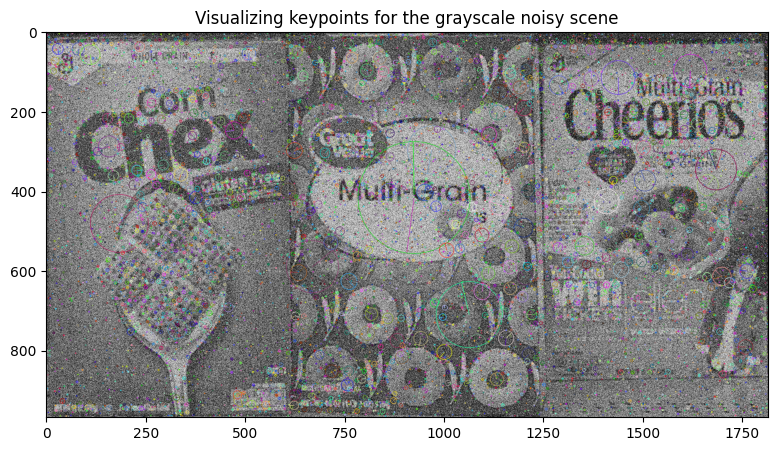

In [ ]:
#@title Detect keypoints for the noisy scene
kp_noisy_scene = sift.detect(gray_scene)

# Describing keypoints for reference and scene images
kp_noisy_scene, _ = sift.compute(gray_scene, kp_noisy_scene)

# Visualize keypoints
noisy_scene_with_kp = cv2.drawKeypoints(gray_scene, kp_noisy_scene, None, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

plt.figure(figsize=(15,5))
plt.title("Visualizing keypoints for the grayscale noisy scene")
plt.imshow(noisy_scene_with_kp)
plt.show()

>> As we can see, the SIFT detector has found several irrelevant keypoints, due to the annoying presence of noise.

---

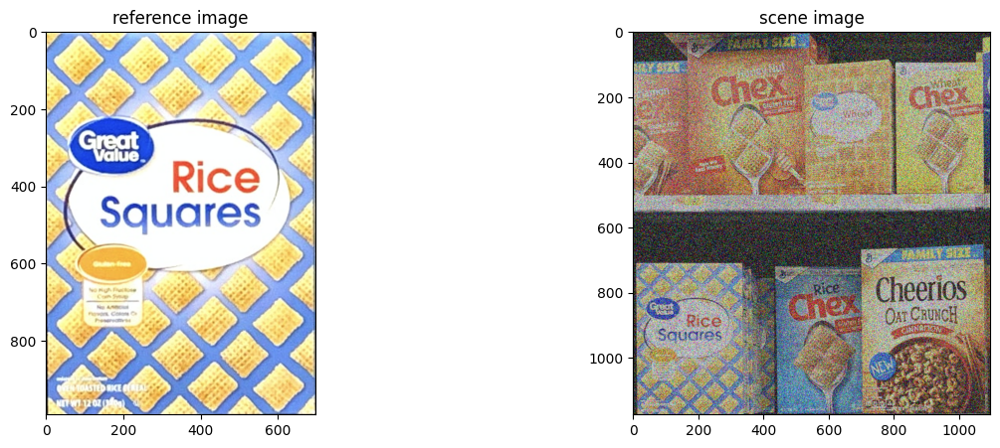

In [41]:
# @title Read and show two samples images, a reference image and a scene image
ref = cv2.imread("models/ref9.png", cv2.IMREAD_COLOR) # or set flag 1
ref_color = cv2.cvtColor(ref, cv2.COLOR_BGR2RGB) # convert to RGB format
scene = cv2.imread("scenes/scene4.png", 1)
scene_color = cv2.cvtColor(scene, cv2.COLOR_BGR2RGB)

# conversion to grayscale
ref = cv2.cvtColor(ref_color, cv2.COLOR_BGR2GRAY)
gray_scene = cv2.cvtColor(scene, cv2.COLOR_BGR2GRAY)

# plot
fig, ax = plt.subplots(1, 2, figsize=(15, 5))
ax[0].imshow(ref_color)
ax[0].set_title("reference image")
ax[1].imshow(scene_color)
ax[1].set_title("scene image")
plt.show()

In [42]:
# @title Denoise function
def denoise_image(noisy_img):
  return cv2.bilateralFilter(cv2.medianBlur(noisy_img, ksize=5), d = 7, sigmaColor=75, sigmaSpace=75)

In [43]:
# @title Computing keypoints through SIFT descriptor
sift = cv2.xfeatures2d.SIFT_create()

def sift_detect_and_visualize(image):
  kp_image, des_image = sift.detectAndCompute(image, None)
  image_with_kp = cv2.drawKeypoints(image, kp_image, None, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
  return kp_image, des_image, image_with_kp

# Initialize SIFT detector
sift = cv2.xfeatures2d.SIFT_create()

# Detect and compute keypoints for both ref and scene images
kp_ref, descriptor_ref = sift.detectAndCompute(ref, None)
kp_scene, descriptor_scene = sift.detectAndCompute(denoise_image(gray_scene), None)

Number of matches: 148
Bounding box | Position: (174, 942) - Height: 465px - Width: 329px
Template matching max value: 0.713


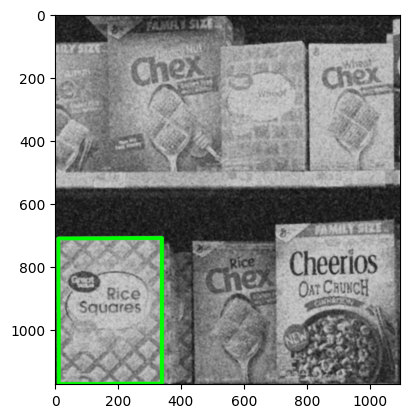

In [47]:
def template_matching_Zncc(img_train, template):
    """
    Perform template matching using Zero-mean Normalized Cross-Correlation (ZNCC).
    :param img_train: The image where the template is to be matched.
    :param template: The template image.
    :return: The maximum value of ZNCC.
    """
    result = cv2.matchTemplate(img_train, template, cv2.TM_CCOEFF_NORMED)
    _, max_val, _, _ = cv2.minMaxLoc(result)
    return max_val

def feature_matcher(ref_img, kp_ref, kp_scene, des_ref, des_scene, scene,
                    min_match_count=100, dist_ratio=0.8, flann_index_kdtree=1, num_checks=50,
                    min_max_val=0.6, min_match_mask_count=10, min_bbox_size=(30, 30)):

    # Defining parameters for algorithm
    index_params = dict(algorithm=flann_index_kdtree, trees=5)
    search_params = dict(checks=num_checks)

    # Initializing matcher
    flann = cv2.FlannBasedMatcher(index_params, search_params)

    # KNN problem: matching and finding the 2 closest elements for each query descriptor
    matches = flann.knnMatch(des_ref, des_scene, k=2)

    # Filter only good matches
    good_matches = [m for m, n in matches if m.distance < dist_ratio * n.distance]

    # Boolean var to check if there is a matching
    match_bool = False

    # Initialize variables to avoid Unbound errors
    img_gray_bbox = scene

    if len(good_matches) > min_match_count:
        print(f"Number of matches: {len(good_matches)}")

        # Building the correspondences arrays of good matches
        src_pts = np.float32([kp_ref[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
        dst_pts = np.float32([kp_scene[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)

        try:
            # Using RANSAC to estimate a robust homography
            M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
            if M is None:
                print("Homography failed. No valid transformation could be found.")
                return scene, match_bool, None, None

            # Mask of discarded points used in visualization
            matchesMask = mask.ravel().tolist()

            # Additional check to ensure that enough homography matches (inliers)
            if sum(matchesMask) >= min_match_mask_count:
                # Corners of the query image
                h, w = ref_img.shape
                pts = np.float32([[0, 0], [0, h-1], [w-1, h-1], [w-1, 0]]).reshape(-1, 1, 2)

                # Apply the homography matrix: project the corners into the train image
                dst = cv2.perspectiveTransform(pts, M)

                # Calculate the bounding rectangle positions
                dst_int = np.int32(dst)
                x, y, w_d, h_d = cv2.boundingRect(dst_int)

                # Check if the bounding box is too small
                if w_d < min_bbox_size[0] or h_d < min_bbox_size[1]:
                    print(f"Bounding box is too small: ({w_d}px x {h_d}px), skipping.")
                    return scene, match_bool, matchesMask, good_matches

                # Drawing the bounding box on the colored scene image
                colored_scene = cv2.cvtColor(scene, cv2.COLOR_GRAY2BGR)  # Convert grayscale scene to BGR
                img_bbox = cv2.polylines(colored_scene, [dst_int], True, (0, 255, 0), 12, cv2.LINE_AA)  # Fixed green bounding box color

                # Convert the image with the bounding box back to grayscale, preserving the green bounding box
                img_gray_bbox = cv2.cvtColor(img_bbox, cv2.COLOR_BGR2GRAY)
                img_gray_bbox = cv2.merge([img_gray_bbox, img_gray_bbox, img_gray_bbox])
                img_gray_bbox[np.where((img_bbox == [0, 255, 0]).all(axis=2))] = [0, 255, 0]

                # Center of the bounding box
                x_center_bbox = x + w_d / 2
                y_center_bbox = y + h_d / 2
                pos_bbox = np.array([x_center_bbox, y_center_bbox])
                print("Bounding box | Position: ({:.0f}, {:.0f}) - Height: {:.0f}px - Width: {:.0f}px".format(
                    pos_bbox[0], pos_bbox[1], h_d, w_d))

                # Resize the reference image based on the bounding box size
                resized_image = cv2.resize(ref_img, (w_d, h_d), interpolation=cv2.INTER_LINEAR)

                # Template matching: further check
                max_val = template_matching_Zncc(scene, resized_image)
                print("Template matching max value: {:.3f}".format(max_val))

                if max_val >= min_max_val:
                    match_bool = True
                    img_bbox = cv2.polylines(scene, [dst_int], True, (0, 255, 0), 15, cv2.LINE_AA)
                else:
                    match_bool = False

            return img_gray_bbox, match_bool, matchesMask, good_matches

        except cv2.error as e:
            print(f"Error occurred during homography computation: {e}")
            return scene, match_bool, None, None

    else:
        print(f"Not enough matches are found - {len(good_matches)}/{min_match_count}")
        return scene, match_bool, None, None

scene_bbox, match_bool, matchesMask, good_matches = feature_matcher(
    ref, kp_ref, kp_scene, descriptor_ref, descriptor_scene, denoise_image(gray_scene),
    min_bbox_size=(30, 30))

if match_bool:
    plt.imshow(scene_bbox, cmap="gray")
else:
    print("No matches found or bounding box is too small, displaying the original scene image.")
    plt.imshow(denoise_image(gray_scene), cmap="gray")

plt.show()

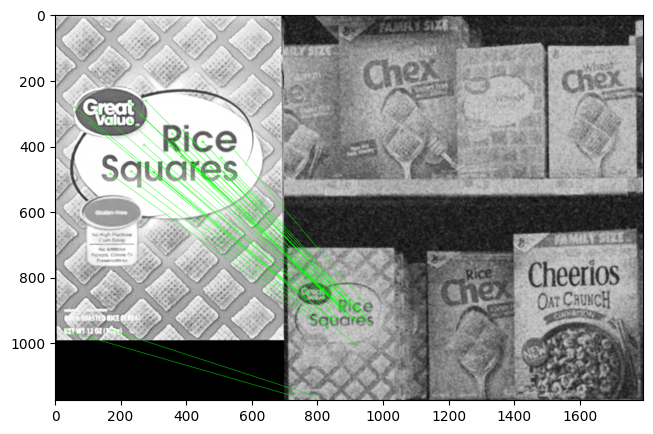

In [46]:
# @title Show correspondances between the reference and the scene image
# Drawing the matches
draw_params = dict(matchColor=(0, 255, 0),  # Green matches
                       singlePointColor=None,
                       matchesMask=matchesMask,  # Ensure this matches the length of 'good'
                       flags=2)  # Not draw keypoints only lines

# Draw correspondences
correspondences = cv2.drawMatches(ref, kp_ref, denoise_image(gray_scene), kp_scene, good_matches, None, **draw_params)
plt.figure(figsize=(15, 5))
plt.imshow(correspondences, cmap='gray')
plt.show()


Processing Reference Image: ref1


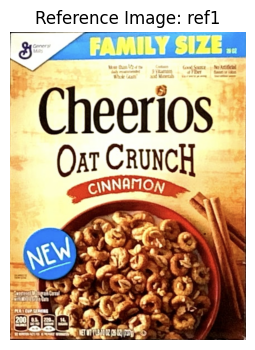


Matching with Scene: scene1
Number of matches: 734
Bounding box | Position: (412, 539) - Height: 1050px - Width: 803px
Template matching max value: 0.976


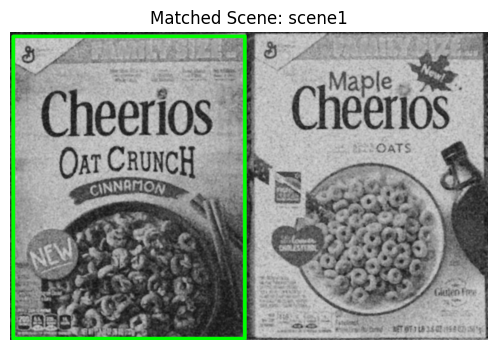


Matching with Scene: scene2
Number of matches: 163
Bounding box | Position: (1543, 484) - Height: 989px - Width: 708px
Error occurred during homography computation: OpenCV(4.10.0) /io/opencv/modules/imgproc/src/templmatch.cpp:1175: error: (-215:Assertion failed) _img.size().height <= _templ.size().height && _img.size().width <= _templ.size().width in function 'matchTemplate'


Matching with Scene: scene3
Number of matches: 95

Matching with Scene: scene4
Number of matches: 304
Bounding box | Position: (888, 912) - Height: 517px - Width: 383px
Template matching max value: 0.798


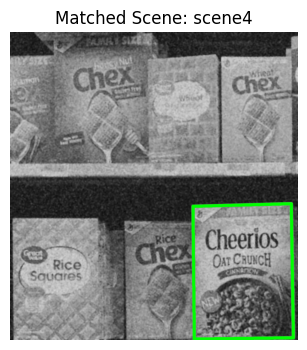


Matching with Scene: scene5
Number of matches: 122

Summary for 'ref1':
╒════════════════════════╤═════════╕
│ Metric                 │   Count │
╞════════════════════════╪═════════╡
│ Total Matched Scenes   │       2 │
├────────────────────────┼─────────┤
│ Correct Matches (TP)   │       2 │
├────────────────────────┼─────────┤
│ Incorrect Matches (FP) │       0 │
├────────────────────────┼─────────┤
│ Missed Matches (FN)    │       0 │
╘════════════════════════╧═════════╛

Correctly Matched Scenes: scene1, scene4

Processing Reference Image: ref2


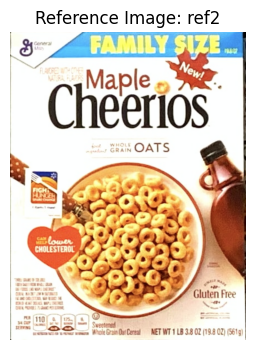


Matching with Scene: scene1
Number of matches: 609
Bounding box | Position: (1248, 533) - Height: 1050px - Width: 804px
Template matching max value: 0.970


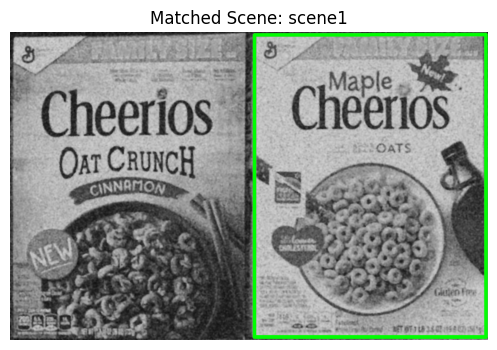


Matching with Scene: scene2
Number of matches: 209
Bounding box | Position: (1532, 446) - Height: 905px - Width: 679px
Template matching max value: 0.111

Matching with Scene: scene3
Number of matches: 90

Matching with Scene: scene4
Number of matches: 153
Bounding box | Position: (885, 932) - Height: 565px - Width: 422px
Template matching max value: 0.339

Matching with Scene: scene5
Number of matches: 136
Bounding box | Position: (690, 345) - Height: 1104px - Width: 697px
Template matching max value: 0.071

Summary for 'ref2':
╒════════════════════════╤═════════╕
│ Metric                 │   Count │
╞════════════════════════╪═════════╡
│ Total Matched Scenes   │       1 │
├────────────────────────┼─────────┤
│ Correct Matches (TP)   │       1 │
├────────────────────────┼─────────┤
│ Incorrect Matches (FP) │       0 │
├────────────────────────┼─────────┤
│ Missed Matches (FN)    │       0 │
╘════════════════════════╧═════════╛

Correctly Matched Scenes: scene1

Processing Reference I

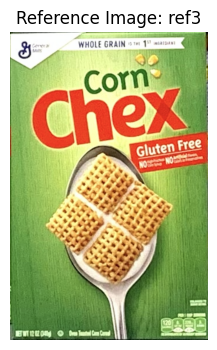


Matching with Scene: scene1
Number of matches: 115

Matching with Scene: scene2
Number of matches: 465
Bounding box | Position: (306, 494) - Height: 943px - Width: 607px
Template matching max value: 0.933


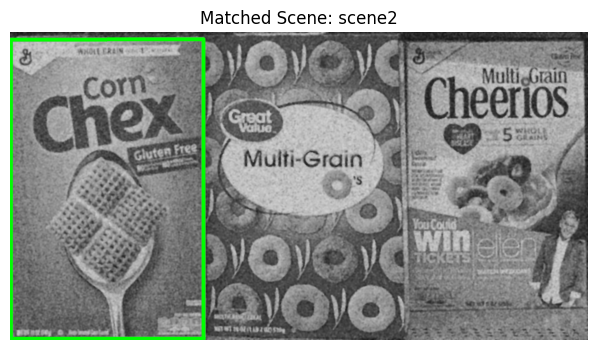


Matching with Scene: scene3
Number of matches: 129
Bounding box | Position: (1438, 446) - Height: 792px - Width: 523px
Error occurred during homography computation: OpenCV(4.10.0) /io/opencv/modules/imgproc/src/templmatch.cpp:1175: error: (-215:Assertion failed) _img.size().height <= _templ.size().height && _img.size().width <= _templ.size().width in function 'matchTemplate'


Matching with Scene: scene4
Number of matches: 132
Bounding box | Position: (826, 644) - Height: 51px - Width: 49px
Template matching max value: 0.457

Matching with Scene: scene5
Number of matches: 95

Summary for 'ref3':
╒════════════════════════╤═════════╕
│ Metric                 │   Count │
╞════════════════════════╪═════════╡
│ Total Matched Scenes   │       1 │
├────────────────────────┼─────────┤
│ Correct Matches (TP)   │       1 │
├────────────────────────┼─────────┤
│ Incorrect Matches (FP) │       0 │
├────────────────────────┼─────────┤
│ Missed Matches (FN)    │       0 │
╘════════════════════════╧

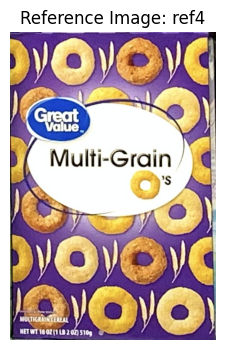


Matching with Scene: scene1
Number of matches: 183
Bounding box is too small: (1px x 1px), skipping.

Matching with Scene: scene2
Number of matches: 373
Bounding box | Position: (928, 484) - Height: 951px - Width: 634px
Template matching max value: 0.961


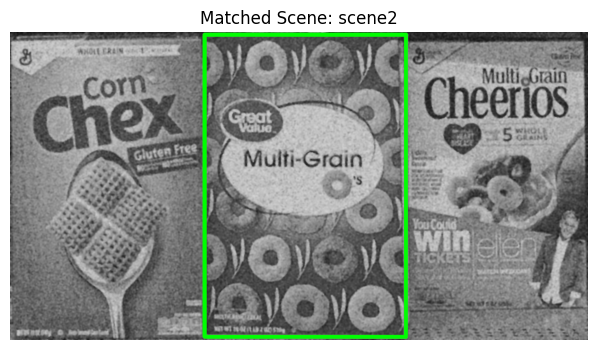


Matching with Scene: scene3
Number of matches: 119

Matching with Scene: scene4
Number of matches: 159
Bounding box is too small: (47px x 35px), skipping.

Matching with Scene: scene5
Number of matches: 148

Summary for 'ref4':
╒════════════════════════╤═════════╕
│ Metric                 │   Count │
╞════════════════════════╪═════════╡
│ Total Matched Scenes   │       1 │
├────────────────────────┼─────────┤
│ Correct Matches (TP)   │       1 │
├────────────────────────┼─────────┤
│ Incorrect Matches (FP) │       0 │
├────────────────────────┼─────────┤
│ Missed Matches (FN)    │       0 │
╘════════════════════════╧═════════╛

Correctly Matched Scenes: scene2

Processing Reference Image: ref5


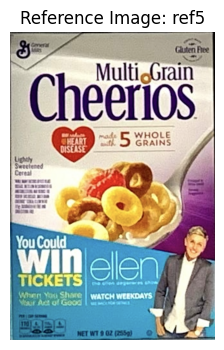


Matching with Scene: scene1
Number of matches: 216
Bounding box | Position: (1252, 552) - Height: 1016px - Width: 688px
Template matching max value: 0.308

Matching with Scene: scene2
Number of matches: 390
Bounding box | Position: (1528, 450) - Height: 846px - Width: 562px
Template matching max value: 0.944


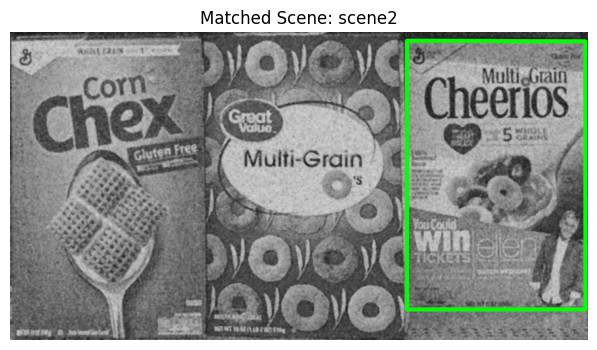


Matching with Scene: scene3
Number of matches: 109
Bounding box | Position: (158, 102) - Height: 54px - Width: 191px
Template matching max value: 0.241

Matching with Scene: scene4
Number of matches: 149
Bounding box | Position: (873, 940) - Height: 522px - Width: 364px
Template matching max value: 0.203

Matching with Scene: scene5
Number of matches: 157
Bounding box is too small: (34px x 37px), skipping.

Summary for 'ref5':
╒════════════════════════╤═════════╕
│ Metric                 │   Count │
╞════════════════════════╪═════════╡
│ Total Matched Scenes   │       1 │
├────────────────────────┼─────────┤
│ Correct Matches (TP)   │       1 │
├────────────────────────┼─────────┤
│ Incorrect Matches (FP) │       0 │
├────────────────────────┼─────────┤
│ Missed Matches (FN)    │       0 │
╘════════════════════════╧═════════╛

Correctly Matched Scenes: scene2

Processing Reference Image: ref6


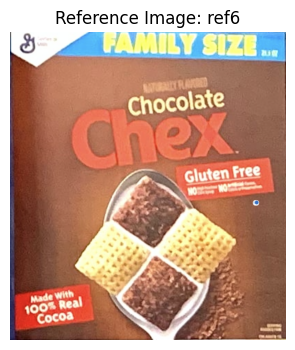


Matching with Scene: scene1
Number of matches: 96

Matching with Scene: scene2
Not enough matches are found - 80/85

Matching with Scene: scene3
Number of matches: 182
Bounding box | Position: (299, 459) - Height: 672px - Width: 602px
Template matching max value: 0.855


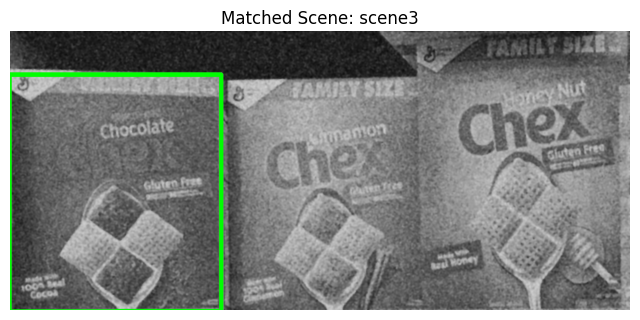


Matching with Scene: scene4
Not enough matches are found - 69/85

Matching with Scene: scene5
Not enough matches are found - 77/85

Summary for 'ref6':
╒════════════════════════╤═════════╕
│ Metric                 │   Count │
╞════════════════════════╪═════════╡
│ Total Matched Scenes   │       1 │
├────────────────────────┼─────────┤
│ Correct Matches (TP)   │       1 │
├────────────────────────┼─────────┤
│ Incorrect Matches (FP) │       0 │
├────────────────────────┼─────────┤
│ Missed Matches (FN)    │       0 │
╘════════════════════════╧═════════╛

Correctly Matched Scenes: scene3

Processing Reference Image: ref7


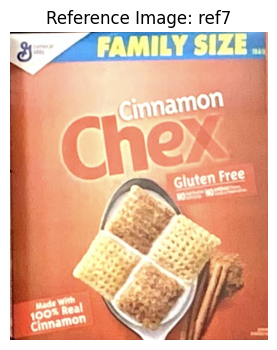


Matching with Scene: scene1
Not enough matches are found - 74/85

Matching with Scene: scene2
Number of matches: 109
Bounding box | Position: (288, 396) - Height: 873px - Width: 729px
Template matching max value: 0.232

Matching with Scene: scene3
Number of matches: 157
Bounding box | Position: (888, 460) - Height: 651px - Width: 545px
Template matching max value: 0.936


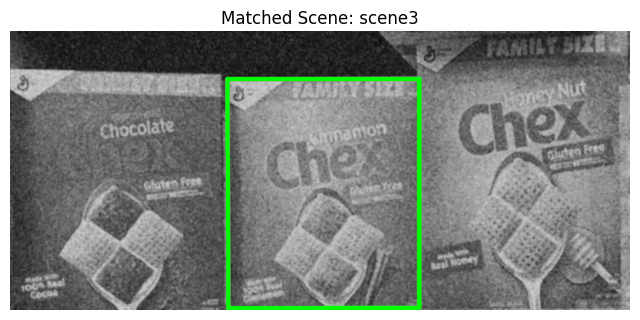


Matching with Scene: scene4
Not enough matches are found - 81/85

Matching with Scene: scene5
Not enough matches are found - 55/85

Summary for 'ref7':
╒════════════════════════╤═════════╕
│ Metric                 │   Count │
╞════════════════════════╪═════════╡
│ Total Matched Scenes   │       1 │
├────────────────────────┼─────────┤
│ Correct Matches (TP)   │       1 │
├────────────────────────┼─────────┤
│ Incorrect Matches (FP) │       0 │
├────────────────────────┼─────────┤
│ Missed Matches (FN)    │       0 │
╘════════════════════════╧═════════╛

Correctly Matched Scenes: scene3

Processing Reference Image: ref8


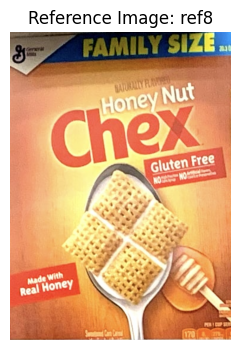


Matching with Scene: scene1
Number of matches: 101
Bounding box | Position: (1295, 1649) - Height: 3260px - Width: 2588px
Template matching max value: 0.239

Matching with Scene: scene2
Number of matches: 158
Bounding box | Position: (286, 437) - Height: 990px - Width: 709px
Error occurred during homography computation: OpenCV(4.10.0) /io/opencv/modules/imgproc/src/templmatch.cpp:1175: error: (-215:Assertion failed) _img.size().height <= _templ.size().height && _img.size().width <= _templ.size().width in function 'matchTemplate'


Matching with Scene: scene3
Number of matches: 243
Bounding box | Position: (1446, 399) - Height: 780px - Width: 561px
Template matching max value: 0.942


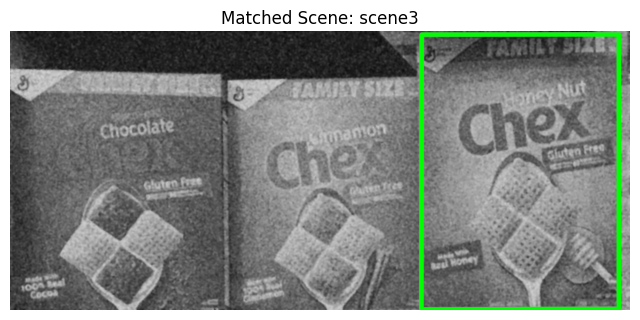


Matching with Scene: scene4
Number of matches: 160
Bounding box | Position: (350, 257) - Height: 490px - Width: 350px
Template matching max value: 0.913


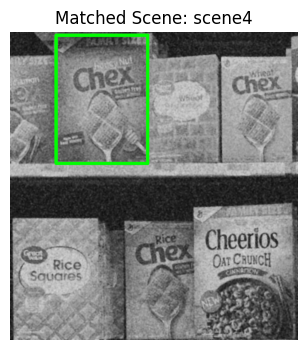


Matching with Scene: scene5
Not enough matches are found - 82/85

Summary for 'ref8':
╒════════════════════════╤═════════╕
│ Metric                 │   Count │
╞════════════════════════╪═════════╡
│ Total Matched Scenes   │       2 │
├────────────────────────┼─────────┤
│ Correct Matches (TP)   │       2 │
├────────────────────────┼─────────┤
│ Incorrect Matches (FP) │       0 │
├────────────────────────┼─────────┤
│ Missed Matches (FN)    │       0 │
╘════════════════════════╧═════════╛

Correctly Matched Scenes: scene3, scene4

Processing Reference Image: ref9


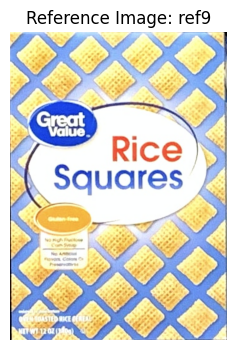


Matching with Scene: scene1
Number of matches: 115
Bounding box is too small: (1px x 1px), skipping.

Matching with Scene: scene2
Number of matches: 196
Bounding box | Position: (928, 416) - Height: 848px - Width: 653px
Template matching max value: 0.307

Matching with Scene: scene3
Number of matches: 120
Bounding box is too small: (28px x 25px), skipping.

Matching with Scene: scene4
Number of matches: 146
Bounding box | Position: (176, 941) - Height: 470px - Width: 329px
Template matching max value: 0.507


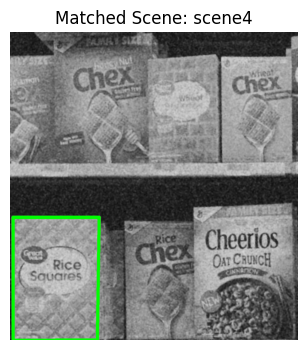


Matching with Scene: scene5
Number of matches: 111

Summary for 'ref9':
╒════════════════════════╤═════════╕
│ Metric                 │   Count │
╞════════════════════════╪═════════╡
│ Total Matched Scenes   │       1 │
├────────────────────────┼─────────┤
│ Correct Matches (TP)   │       1 │
├────────────────────────┼─────────┤
│ Incorrect Matches (FP) │       0 │
├────────────────────────┼─────────┤
│ Missed Matches (FN)    │       0 │
╘════════════════════════╧═════════╛

Correctly Matched Scenes: scene4

Processing Reference Image: ref10


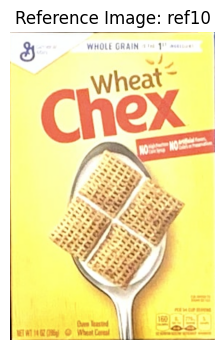


Matching with Scene: scene1
Not enough matches are found - 82/85

Matching with Scene: scene2
Number of matches: 109
Bounding box | Position: (310, 555) - Height: 1086px - Width: 721px
Error occurred during homography computation: OpenCV(4.10.0) /io/opencv/modules/imgproc/src/templmatch.cpp:1175: error: (-215:Assertion failed) _img.size().height <= _templ.size().height && _img.size().width <= _templ.size().width in function 'matchTemplate'


Matching with Scene: scene3
Not enough matches are found - 85/85

Matching with Scene: scene4
Number of matches: 93
Bounding box | Position: (940, 297) - Height: 406px - Width: 270px
Template matching max value: 0.766


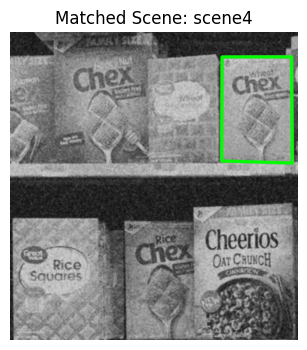


Matching with Scene: scene5
Not enough matches are found - 46/85

Summary for 'ref10':
╒════════════════════════╤═════════╕
│ Metric                 │   Count │
╞════════════════════════╪═════════╡
│ Total Matched Scenes   │       1 │
├────────────────────────┼─────────┤
│ Correct Matches (TP)   │       1 │
├────────────────────────┼─────────┤
│ Incorrect Matches (FP) │       0 │
├────────────────────────┼─────────┤
│ Missed Matches (FN)    │       0 │
╘════════════════════════╧═════════╛

Correctly Matched Scenes: scene4

Processing Reference Image: ref11


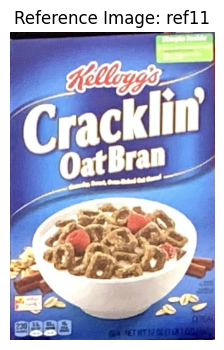


Matching with Scene: scene1
Not enough matches are found - 80/85

Matching with Scene: scene2
Not enough matches are found - 64/85

Matching with Scene: scene3
Not enough matches are found - 46/85

Matching with Scene: scene4
Not enough matches are found - 69/85

Matching with Scene: scene5
Number of matches: 195
Bounding box | Position: (369, 752) - Height: 555px - Width: 368px
Template matching max value: 0.931


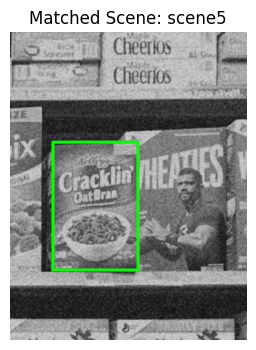


Summary for 'ref11':
╒════════════════════════╤═════════╕
│ Metric                 │   Count │
╞════════════════════════╪═════════╡
│ Total Matched Scenes   │       1 │
├────────────────────────┼─────────┤
│ Correct Matches (TP)   │       1 │
├────────────────────────┼─────────┤
│ Incorrect Matches (FP) │       0 │
├────────────────────────┼─────────┤
│ Missed Matches (FN)    │       0 │
╘════════════════════════╧═════════╛

Correctly Matched Scenes: scene5

Processing Reference Image: ref12


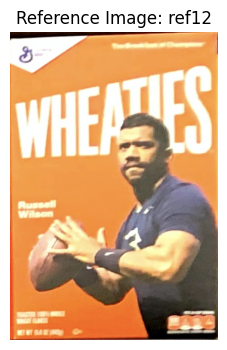


Matching with Scene: scene1
Not enough matches are found - 41/85

Matching with Scene: scene2
Not enough matches are found - 43/85

Matching with Scene: scene3
Not enough matches are found - 20/85

Matching with Scene: scene4
Not enough matches are found - 22/85

Matching with Scene: scene5
Number of matches: 109
Bounding box | Position: (714, 742) - Height: 663px - Width: 441px
Template matching max value: 0.645


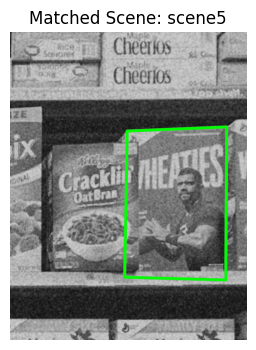


Summary for 'ref12':
╒════════════════════════╤═════════╕
│ Metric                 │   Count │
╞════════════════════════╪═════════╡
│ Total Matched Scenes   │       1 │
├────────────────────────┼─────────┤
│ Correct Matches (TP)   │       1 │
├────────────────────────┼─────────┤
│ Incorrect Matches (FP) │       0 │
├────────────────────────┼─────────┤
│ Missed Matches (FN)    │       0 │
╘════════════════════════╧═════════╛

Correctly Matched Scenes: scene5

Processing Reference Image: ref13


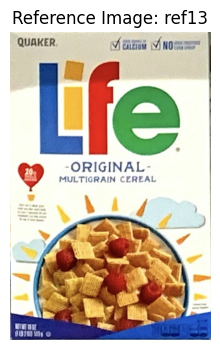


Matching with Scene: scene1
Number of matches: 91

Matching with Scene: scene2
Number of matches: 115
Bounding box is too small: (2px x 1px), skipping.

Matching with Scene: scene3
Not enough matches are found - 69/85

Matching with Scene: scene4
Number of matches: 106
Bounding box is too small: (15px x 19px), skipping.

Matching with Scene: scene5
Number of matches: 90

Summary for 'ref13':
╒════════════════════════╤═════════╕
│ Metric                 │   Count │
╞════════════════════════╪═════════╡
│ Total Matched Scenes   │       0 │
├────────────────────────┼─────────┤
│ Correct Matches (TP)   │       0 │
├────────────────────────┼─────────┤
│ Incorrect Matches (FP) │       0 │
├────────────────────────┼─────────┤
│ Missed Matches (FN)    │       0 │
╘════════════════════════╧═════════╛

Processing Reference Image: ref14


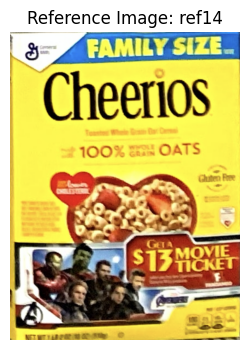


Matching with Scene: scene1
Number of matches: 155
Bounding box | Position: (1238, 564) - Height: 1005px - Width: 808px
Template matching max value: 0.292

Matching with Scene: scene2
Number of matches: 136
Bounding box | Position: (1528, 432) - Height: 807px - Width: 649px
Template matching max value: 0.185

Matching with Scene: scene3
Not enough matches are found - 52/85

Matching with Scene: scene4
Number of matches: 112
Bounding box | Position: (882, 922) - Height: 473px - Width: 405px
Template matching max value: 0.336

Matching with Scene: scene5
Number of matches: 96
Bounding box | Position: (598, 594) - Height: 1246px - Width: 829px
Template matching max value: 0.169

Summary for 'ref14':
╒════════════════════════╤═════════╕
│ Metric                 │   Count │
╞════════════════════════╪═════════╡
│ Total Matched Scenes   │       0 │
├────────────────────────┼─────────┤
│ Correct Matches (TP)   │       0 │
├────────────────────────┼─────────┤
│ Incorrect Matches (FP) │       0

In [48]:
# @title Instance Detection system
from natsort import natsorted
from tabulate import tabulate

# Ground truth correspondences
ground_truth = {
    "ref1": ["scene1", "scene4"],
    "ref2": ["scene1"],
    "ref3": ["scene2"],
    "ref4": ["scene2"],
    "ref5": ["scene2"],
    "ref6": ["scene3"],
    "ref7": ["scene3"],
    "ref8": ["scene3", "scene4"],
    "ref9": ["scene4"],
    "ref10": ["scene4"],
    "ref11": ["scene5"],
    "ref12": ["scene5"],
    "ref13": [],
    "ref14": []
}

# Initialize counters for True Positives, False Positives, and False Negatives
TP = 0
FP = 0
FN = 0

# Load reference and scene images
references = natsorted(os.listdir("models"))[:14]
scenes = natsorted(os.listdir("scenes"))[:5]

# Main loop through the reference images
for i, ref_filename in enumerate(references):
    ref_name = f"ref{i+1}"
    print(f"\n{'='*60}\nProcessing Reference Image: {ref_name}\n{'='*60}")

    # Load and display the reference image
    ref = cv2.imread(os.path.join("models", ref_filename), 1)
    ref_color = cv2.cvtColor(ref, cv2.COLOR_BGR2RGB)
    ref = cv2.cvtColor(ref_color, cv2.COLOR_BGR2GRAY)  # Convert to grayscale

    plt.figure(figsize=(8, 4))
    plt.title(f"Reference Image: {ref_name}")
    plt.imshow(ref_color)
    plt.axis('off')
    plt.show()

    # SIFT initialization and keypoint detection
    sift = cv2.SIFT_create()
    kp_ref = sift.detect(ref)

    scenes_matched_list = []  # List to store matched scenes

    # Loop through scenes
    for scene_filename in scenes:
        scene_name = scene_filename.replace('.png', '')
        print(f"\nMatching with Scene: {scene_name}")

        # Load scene image
        scene = cv2.imread(os.path.join("scenes", scene_filename), 1)
        scene_color = cv2.cvtColor(scene, cv2.COLOR_BGR2RGB)
        gray_scene = cv2.cvtColor(scene_color, cv2.COLOR_BGR2GRAY)
        denoised_scene = denoise_image(gray_scene)

        # Keypoint detection and description
        kp_scene = sift.detect(denoised_scene)
        kp_ref, descriptor_ref = sift.compute(ref, kp_ref)
        kp_scene, descriptor_scene = sift.compute(denoised_scene, kp_scene)

        # Feature matching
        scene_bbox, match_bool, matchesMask, good_matches = feature_matcher(
            ref, kp_ref, kp_scene, descriptor_ref, descriptor_scene, denoised_scene,
            min_match_count=85, min_max_val=0.5, min_bbox_size=(40, 40)
        )

        if match_bool:
            scenes_matched_list.append(scene_name)

            # Display the scene with bounding box
            plt.figure(figsize=(8, 4))
            plt.title(f"Matched Scene: {scene_name}")
            plt.imshow(scene_bbox, cmap="gray")
            plt.axis('off')
            plt.show()

    # Compare matched scenes with ground truth
    true_scenes = ground_truth.get(ref_name, [])
    correct_matches = [scene for scene in scenes_matched_list if scene in true_scenes]
    incorrect_matches = [scene for scene in scenes_matched_list if scene not in true_scenes]

    TP += len(correct_matches)
    FP += len(incorrect_matches)
    FN += len([scene for scene in true_scenes if scene not in scenes_matched_list])

    # Print the results for the current reference image
    print(f"\nSummary for '{ref_name}':")
    print(tabulate([
        ["Total Matched Scenes", len(scenes_matched_list)],
        ["Correct Matches (TP)", len(correct_matches)],
        ["Incorrect Matches (FP)", len(incorrect_matches)],
        ["Missed Matches (FN)", len([scene for scene in true_scenes if scene not in scenes_matched_list])],
    ], headers=["Metric", "Count"], tablefmt="fancy_grid"))

    if correct_matches:
        print(f"\n\033[92mCorrectly Matched Scenes: {', '.join(correct_matches)}\033[0m")
    if incorrect_matches:
        print(f"\n\033[91mIncorrectly Matched Scenes: {', '.join(incorrect_matches)}\033[0m")

# Calculate Precision, Recall, and Accuracy
precision = TP / (TP + FP) if (TP + FP) > 0 else 0
recall = TP / (TP + FN) if (TP + FN) > 0 else 0
accuracy = (precision + recall) / 2

print(f"\n{'='*60}\nOverall System Performance\n{'='*60}")
print(f"Precision: \033[94m{precision:.2f}\033[0m")
print(f"Recall: \033[94m{recall:.2f}\033[0m")
print(f"Accuracy: \033[94m{accuracy:.2f}\033[0m")


----------------

## Track B: multiple Instance Detection

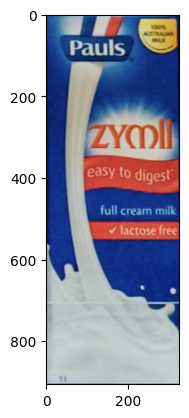

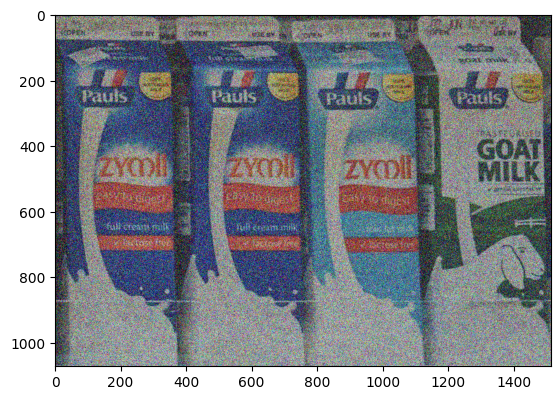

In [ ]:
# @title Read and show two samples images, a reference image and a scene image
ref = cv2.imread("models/ref15.png", cv2.IMREAD_COLOR) # or set flag 1
ref_color = cv2.cvtColor(ref, cv2.COLOR_BGR2RGB) # convert to RGB format
scene = cv2.imread("scenes/scene6.png", 1)
scene_color = cv2.cvtColor(scene, cv2.COLOR_BGR2RGB)

plt.imshow(ref_color)
plt.show()
plt.imshow(scene_color)
plt.show()

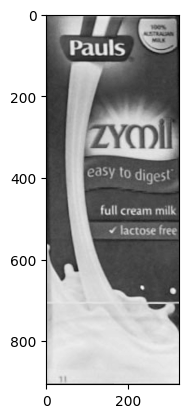

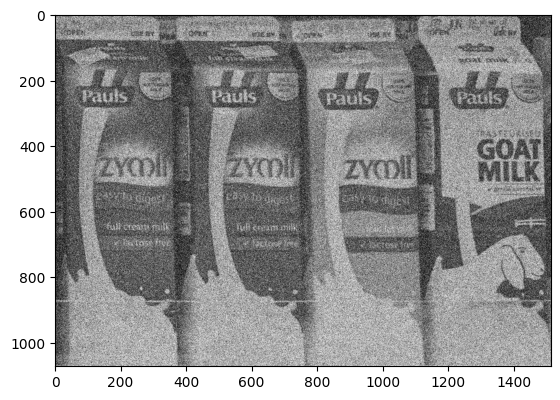

In [ ]:
# @title Conversion to grayscale
ref = cv2.cvtColor(ref_color, cv2.COLOR_BGR2GRAY)
noisy_scene = cv2.cvtColor(scene_color, cv2.COLOR_BGR2GRAY)

plt.imshow(ref, cmap = "gray")
plt.show()
plt.imshow(noisy_scene, cmap = "gray")
plt.show()

Filtered image


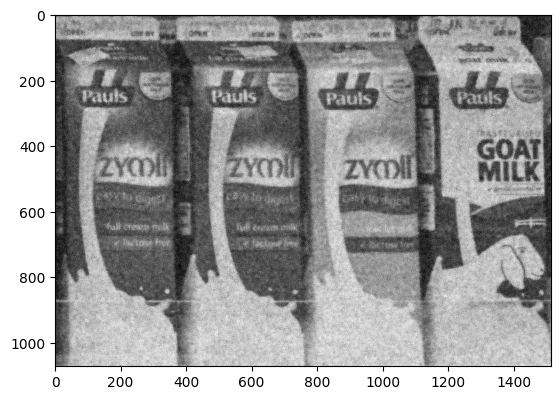

In [ ]:
#@title Bilateral Filtering
# k size
filter_size = 15

# sigmaColor controls the color space filtering: in particular, controls the degree to which pixels with similar intensity values are considered for smoothing
sigmaColor = 75

# sigmaSpace controls the spatial filtering: it specifies how far from the central pixel the filter will consider neighboring pixels.
sigmaSpace = 75

# Applying the bilateral filter
scene = cv2.bilateralFilter(noisy_scene, filter_size, sigmaColor, sigmaSpace)

# Display the image after filtering.
print("Filtered image")
plt.imshow(scene, cmap="gray")
plt.show()

In [ ]:
# @title Computing keypoints through SIFT descriptor
# Initialize SIFT detector
sift = cv2.xfeatures2d.SIFT_create()

# Detect keypoints for both images
kp_ref = sift.detect(ref)
kp_scene = sift.detect(scene)

# Describing keypoints for reference and scene images
kp_ref, descriptor_ref = sift.compute(ref, kp_ref)
kp_scene, descriptor_scene = sift.compute(scene, kp_scene)

In [ ]:
# @title Feature matching for multiple instances
def feature_matcher_2(ref_img, scene_img, kp_ref, kp_scene, des_ref, des_scene, colored_scene):

  # Defining parameters for algorithm
  index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)

  # Defining search parameters
  search_params = dict(checks = NUM_CHECKS)

  # Initializing matcher
  flann = cv2.FlannBasedMatcher(index_params, search_params)

  # KNN problem: matching and finding the 2 closest elements for each query descriptor
  matches = flann.knnMatch(des_ref, des_scene, k = 2)

  # Filter only good matches
  good = []
  for m, n in matches:
      if m.distance < DIST_RATIO * n.distance:
          good.append(m)

  # Boolean var to check if there is a matching
  match_bool = False

  # Checking if we found enough matchings
  if len(good) > MIN_MATCH_COUNT:

      print(f"number of matches: {len(good)}")

      match_bool = True

      # building the correspondences arrays of good matches
      # reshaping explanation:
        # -1 in the first dimension indicates that the number of rows will be automatically inferred based on the total number of elements.
        # 1 in the second dimension creates a single column (which might seem unnecessary at first glance).
        # 2 in the third dimension ensures there are two elements per row, representing the x and y coordinates of each keypoint.
      src_pts = np.float32([ kp_ref[m.queryIdx].pt for m in good ]).reshape(-1,1,2)
      dst_pts = np.float32([ kp_scene[m.trainIdx].pt for m in good ]).reshape(-1,1,2)

      # Using RANSAC to estimate a robust homography.
      # It returns the homography M and a mask for the discarded points (the outliers)
      M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

      # Mask of discarded point used in visualization
      # Each element indicates whether the corresponding point was considered an inlier (1) or an outlier (0) by RANSAC.
      matchesMask = mask.ravel().tolist()

      # Corners of the query image
      h,w = ref_img.shape
      pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)

      # Apply the homography matrix: project the corners into the train image
      dst = cv2.perspectiveTransform(pts, M)

      # Drawing the bounding box
      img_bbox = cv2.polylines(colored_scene, [np.int32(dst)], True, (20, 255, 0), 12, cv2.LINE_AA) # green bounding box

      # Display the center of the retrieved bounding box and its heigth/width
      bbox = dst.copy().reshape(-1, 2)
      heigth_bbox = bbox[1][1] - bbox[0][1] # the bottom-left corner y-coord minus the top-left one
      width_bbox = bbox[2][0] - bbox[1][0] # the bottom-right corner x-coord minus the bottom-left one
      x_center_bbox = (bbox[0][0] + bbox[1][0] + bbox[2][0] + bbox[3][0])/4
      y_center_bbox = (bbox[0][1] + bbox[1][1] + bbox[2][1] + bbox[3][1])/4
      pos_bbox = np.array([x_center_bbox, y_center_bbox])
      print("bounding box | position: ({:.0f}, {:.0f}) - height: {:.0f}px - width: {:.0f}px".format(pos_bbox[0], pos_bbox[1],heigth_bbox, width_bbox))

      return img_bbox, match_bool
  else:
      print( "Not enough matches are found - {}/{}".format(len(good), MIN_MATCH_COUNT) )
      matchesMask = None

  return colored_scene, match_bool

Not enough matches are found - 87/100


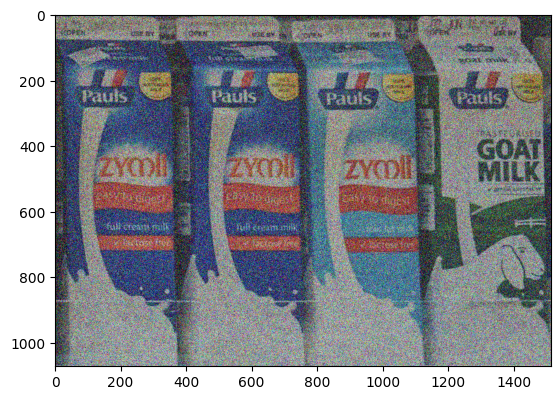

In [ ]:
# Show scene image with bounding box
scene_bbox, _ = feature_matcher_2(ref, scene, kp_ref, kp_scene, descriptor_ref, descriptor_scene, scene_color)

plt.imshow(scene_bbox)
plt.show()